#### Have you any sleep disorder? don't know? ....Don't worry it will predict

# Presenting Sleep Disorder Prediction Model

In [1]:
import numpy as np
import pandas as pd
import matplotlib as plt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
df=pd.read_csv("Sleep_health_and_lifestyle_dataset.csv")

In [4]:
df.head(10)

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
0,1,Male,27,Software Engineer,6.1,6,42,6,Overweight,126/83,77,4200,None
1,2,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,None
2,3,Male,28,Doctor,6.2,6,60,8,Normal,125/80,75,10000,None
3,4,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea
4,5,Male,28,Sales Representative,5.9,4,30,8,Obese,140/90,85,3000,Sleep Apnea
5,6,Male,28,Software Engineer,5.9,4,30,8,Obese,140/90,85,3000,Insomnia
6,7,Male,29,Teacher,6.3,6,40,7,Obese,140/90,82,3500,Insomnia
7,8,Male,29,Doctor,7.8,7,75,6,Normal,120/80,70,8000,None
8,9,Male,29,Doctor,7.8,7,75,6,Normal,120/80,70,8000,None
9,10,Male,29,Doctor,7.8,7,75,6,Normal,120/80,70,8000,None


In [5]:
df.tail()

,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder
369,370,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
370,371,Female,59,Nurse,8.0,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
371,372,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
372,373,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea
373,374,Female,59,Nurse,8.1,9,75,3,Overweight,140/95,68,7000,Sleep Apnea


In [6]:
df.shape

(374, 13)

In [7]:
df.duplicated().sum()

0

In [8]:
df.isnull().sum()

Person ID                  0
Gender                     0
Age                        0
Occupation                 0
Sleep Duration             0
Quality of Sleep           0
Physical Activity Level    0
Stress Level               0
BMI Category               0
Blood Pressure             0
Heart Rate                 0
Daily Steps                0
Sleep Disorder             0
dtype: int64

Observation:-

1. There is no NULL value in our dataset

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374 entries, 0 to 373
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Person ID                374 non-null    int64  
 1   Gender                   374 non-null    object 
 2   Age                      374 non-null    int64  
 3   Occupation               374 non-null    object 
 4   Sleep Duration           374 non-null    float64
 5   Quality of Sleep         374 non-null    int64  
 6   Physical Activity Level  374 non-null    int64  
 7   Stress Level             374 non-null    int64  
 8   BMI Category             374 non-null    object 
 9   Blood Pressure           374 non-null    object 
 10  Heart Rate               374 non-null    int64  
 11  Daily Steps              374 non-null    int64  
 12  Sleep Disorder           374 non-null    object 
dtypes: float64(1), int64(7), object(5)
memory usage: 38.1+ KB


In [10]:
df.describe()

,Person ID,Age,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,Heart Rate,Daily Steps
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,187.500000,42.184492,7.132086,7.312834,59.171123,5.385027,70.165775,6816.844920
std,108.108742,8.673133,0.795657,1.196956,20.830804,1.774526,4.135676,1617.915679
min,1.000000,27.000000,5.800000,4.000000,30.000000,3.000000,65.000000,3000.000000
25%,94.250000,35.250000,6.400000,6.000000,45.000000,4.000000,68.000000,5600.000000
50%,187.500000,43.000000,7.200000,7.000000,60.000000,5.000000,70.000000,7000.000000
75%,280.750000,50.000000,7.800000,8.000000,75.000000,7.000000,72.000000,8000.000000
max,374.000000,59.000000,8.500000,9.000000,90.000000,8.000000,86.000000,10000.000000


In [11]:
df.nunique()

Person ID                  374
Gender                       2
Age                         31
Occupation                  11
Sleep Duration              27
Quality of Sleep             6
Physical Activity Level     16
Stress Level                 6
BMI Category                 4
Blood Pressure              25
Heart Rate                  19
Daily Steps                 20
Sleep Disorder               3
dtype: int64

##                       EDA

In [12]:
numerical_columns=df.select_dtypes(include=["int64","float64"]).columns
print("Numerical_columns: \n",numerical_columns)

for column in numerical_columns:
    unique_values = df[column].unique()
    print(f"{column}:{unique_values}")

Numerical_columns: 
 Index(['Person ID', 'Age', 'Sleep Duration', 'Quality of Sleep',
       'Physical Activity Level', 'Stress Level', 'Heart Rate', 'Daily Steps'],
      dtype='object')
Person ID:[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198

In [13]:
object_columns = df.select_dtypes(include=["object"]).columns
print("object_columns: \n", object_columns)

for column in object_columns:
    unique_values= df[column].unique()
    print(f"{column}:{unique_values}")

object_columns: 
 Index(['Gender', 'Occupation', 'BMI Category', 'Blood Pressure',
       'Sleep Disorder'],
      dtype='object')
Gender:['Male' 'Female']
Occupation:['Software Engineer' 'Doctor' 'Sales Representative' 'Teacher' 'Nurse'
 'Engineer' 'Accountant' 'Scientist' 'Lawyer' 'Salesperson' 'Manager']
BMI Category:['Overweight' 'Normal' 'Obese' 'Normal Weight']
Blood Pressure:['126/83' '125/80' '140/90' '120/80' '132/87' '130/86' '117/76' '118/76'
 '128/85' '131/86' '128/84' '115/75' '135/88' '129/84' '130/85' '115/78'
 '119/77' '121/79' '125/82' '135/90' '122/80' '142/92' '140/95' '139/91'
 '118/75']
Sleep Disorder:['None' 'Sleep Apnea' 'Insomnia']


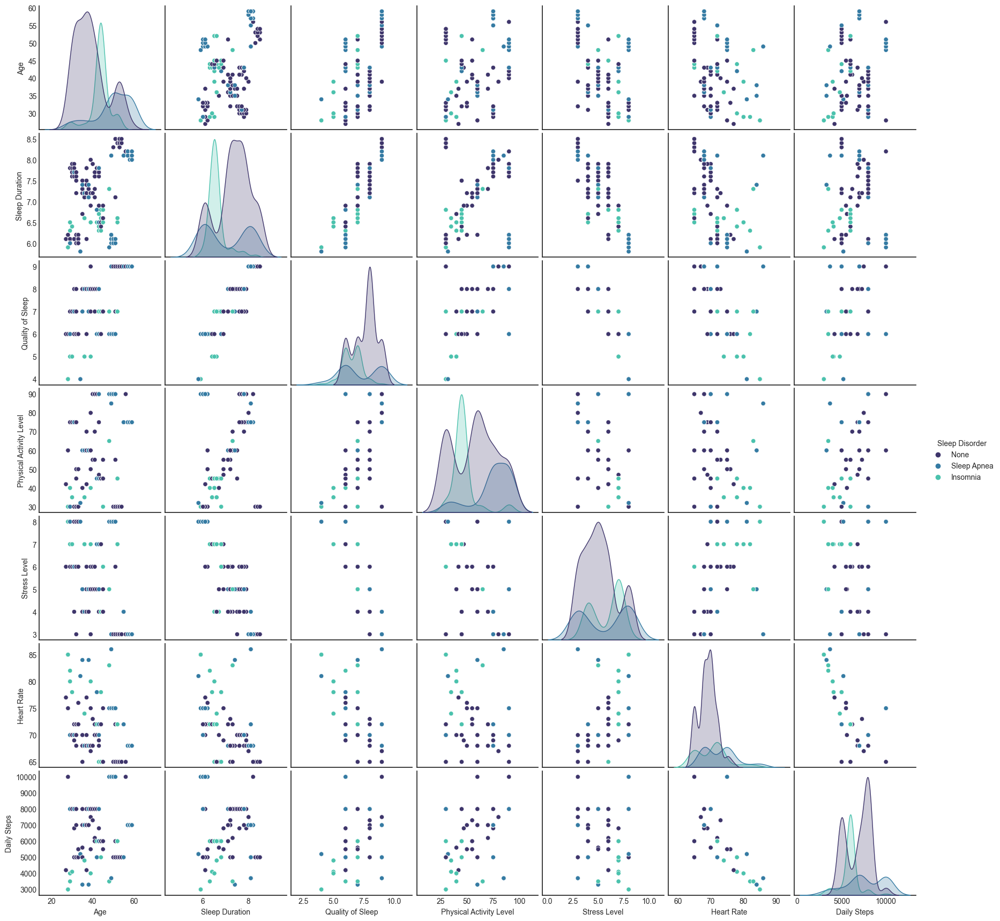

In [14]:
plt.style.use("seaborn-white")
sns.pairplot(df.drop("Person ID",axis=1),hue="Sleep Disorder" , palette="mako")
# plt.legend()
plt.show()

In [15]:
df['Sleep Disorder'].value_counts()

None           219
Sleep Apnea     78
Insomnia        77
Name: Sleep Disorder, dtype: int64

Observation :-

1. It is clear that the proportion of normal people are more than sleeping disorder


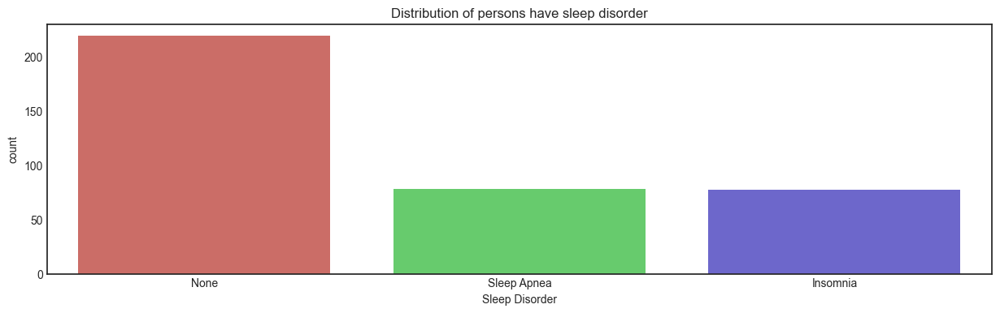

In [16]:
plt.figure(figsize=(15,4))
sns.countplot(x=df['Sleep Disorder'], data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.title("Distribution of persons have sleep disorder")
plt.show()

In [17]:
counts = df['Sleep Disorder'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Proportion of Sleep Disorder')
fig.show()

In [18]:
df["Gender"].value_counts()

Male      189
Female    185
Name: Gender, dtype: int64

In [19]:
fig= go.Figure(data=[go.Bar(x=df['Gender'].value_counts().index, y= df['Gender'].value_counts())])
fig.update_layout(title = "Distribution of gender",
                 xaxis_title='Gender',
                 yaxis_title = 'Count')
fig.show()

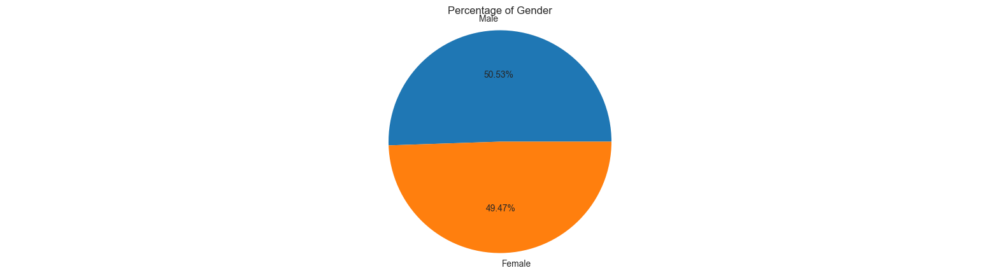

In [20]:
plt.figure(figsize=(20,5))
counts = df['Gender'].value_counts()
plt.pie(counts, labels = counts.index, autopct='%1.2f%%')
plt.title('Percentage of Gender')
plt.axis('equal')
plt.show()

In [21]:
df.groupby('Sleep Disorder')['Gender'].value_counts()

Sleep Disorder  Gender
Insomnia        Male       41
                Female     36
None            Male      137
                Female     82
Sleep Apnea     Female     67
                Male       11
Name: Gender, dtype: int64

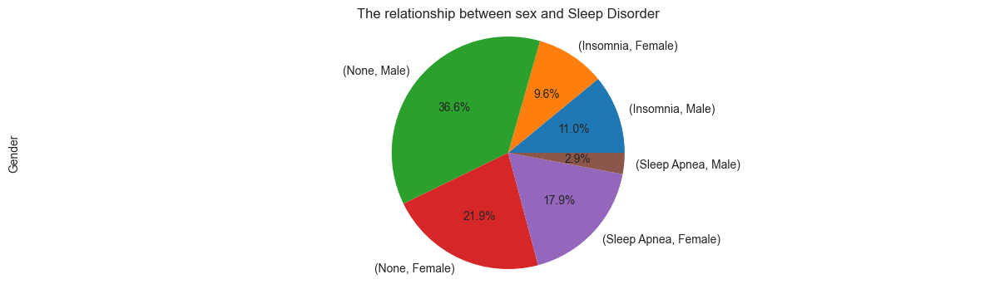

In [22]:
df.groupby('Sleep Disorder')['Gender'].value_counts().plot.pie(autopct ='%1.1f%%',figsize=(15,4))
                                                               
# colors=['#4A235A','pink','#4A235A','pink','#4A235A','pink'])
plt.title('The relationship between sex and Sleep Disorder')
plt.axis('equal')
plt.show()

Observation:-

1. It is clear that Normal men more than women
2. It is clear that Men who suffer from Insomnia more than women
3. It is clear that Women who suffer from Sleep Apnea more than men

In [23]:
df["Occupation"].value_counts()

Nurse                   73
Doctor                  71
Engineer                63
Lawyer                  47
Teacher                 40
Accountant              37
Salesperson             32
Software Engineer        4
Scientist                4
Sales Representative     2
Manager                  1
Name: Occupation, dtype: int64

In [24]:
fig = go.Figure(data= [go.Bar(x=df['Occupation'].value_counts().index, y= df['Occupation'].value_counts())])
fig.update_layout(title = 'Distribution of Occupation',
                 xaxis_title = "Occupation",
                 yaxis_title = "counts")
fig.show()

In [25]:
counts = df['Occupation'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Proportion of Occupation')
fig.show()

In [26]:
df.groupby('Sleep Disorder')['Occupation'].value_counts()

Sleep Disorder  Occupation          
Insomnia        Salesperson             29
                Teacher                 27
                Accountant               7
                Engineer                 5
                Doctor                   3
                Nurse                    3
                Lawyer                   2
                Software Engineer        1
None            Doctor                  64
                Engineer                57
                Lawyer                  42
                Accountant              30
                Nurse                    9
                Teacher                  9
                Software Engineer        3
                Salesperson              2
                Scientist                2
                Manager                  1
Sleep Apnea     Nurse                   61
                Doctor                   4
                Teacher                  4
                Lawyer                   3
                S

In [27]:
fig=px.treemap(df,path=[px.Constant('Jobs'),'Sleep Disorder','Occupation'],
               color='Sleep Disorder',
              color_discrete_sequence=['#EBDEF0','#C39BD3','#4A235A'])


fig.update_layout(title='The effect of job on sleep',
                 title_font={'size':20})


fig.show()

Observation:-

1. It is clear that in Normal, Doctor more than others

2. It is clear that the people who suffer from Insomnia, Salesperson more than others

2. It is clear that the people who suffer from Sleep Apnea, Nurse more than others

In [28]:
df['BMI Category'].value_counts()

Normal           195
Overweight       148
Normal Weight     21
Obese             10
Name: BMI Category, dtype: int64

In [29]:
df.pivot_table(index='BMI Category', 
               columns='Sleep Disorder',
               aggfunc={'Sleep Disorder': 'count'}).style.background_gradient(axis=0,cmap='YlOrRd')

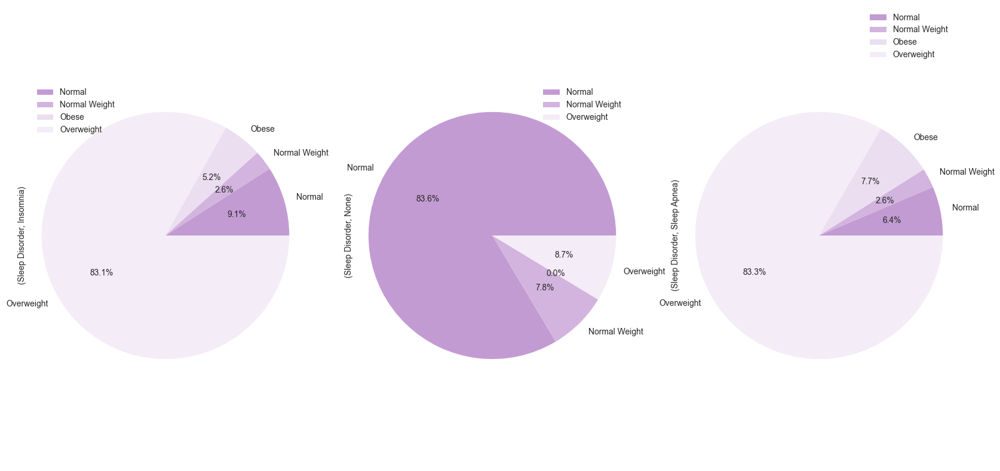

In [30]:
df.pivot_table(index='BMI Category',columns='Sleep Disorder',
               aggfunc={'Sleep Disorder':'count'}).plot.pie(autopct ='%1.1f%%',subplots=True,figsize=(20,10),
                                                            colors=['#C39BD3','#D2B4DE','#EBDEF0','#F4ECF7'])

plt.axis('equal')
plt.show()


In [31]:
fig = go.Figure(data=[go.Bar(x=df['BMI Category'].value_counts().index, y=df['BMI Category'].value_counts())])
fig.update_layout(
 title= 'BMI Category',
 xaxis_title="BMI Category",
 yaxis_title="Count"
 )
fig.show()

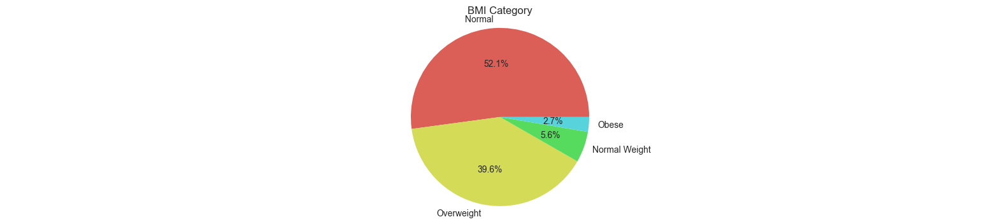

In [32]:
plt.figure(figsize=(20, 4))
counts = df['BMI Category'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('BMI Category')
plt.axis("equal")
plt.show()

In [33]:
df[['Systolic', 'Diastolic']] = df['Blood Pressure'].str.split('/', expand=True).astype(int)
# df[['Systolic', 'Diastolic']]

In [34]:
# df.groupby('Sleep Disorder')['Diastolic'].value_counts()

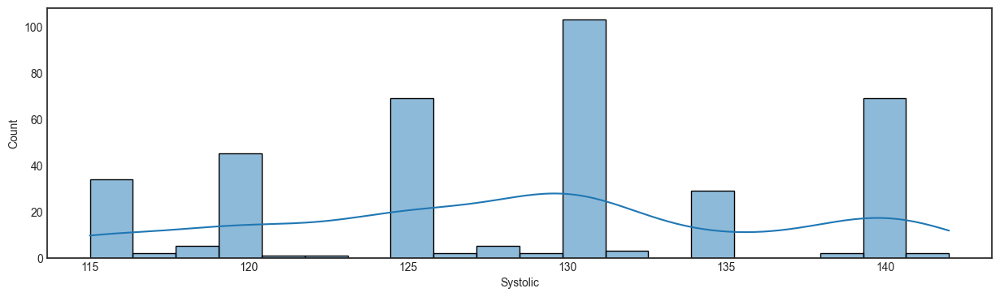

In [35]:
plt.figure(figsize=(15,4))
sns.histplot(df['Systolic'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

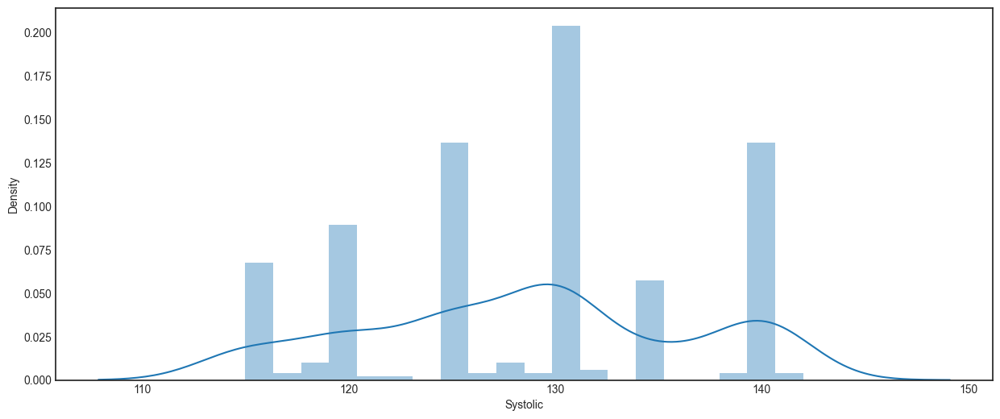

In [36]:
plt.figure(figsize=(15,6))
sns.distplot(df['Systolic'], kde = True, bins = 20)
plt.xticks(rotation = 0)
plt.show()

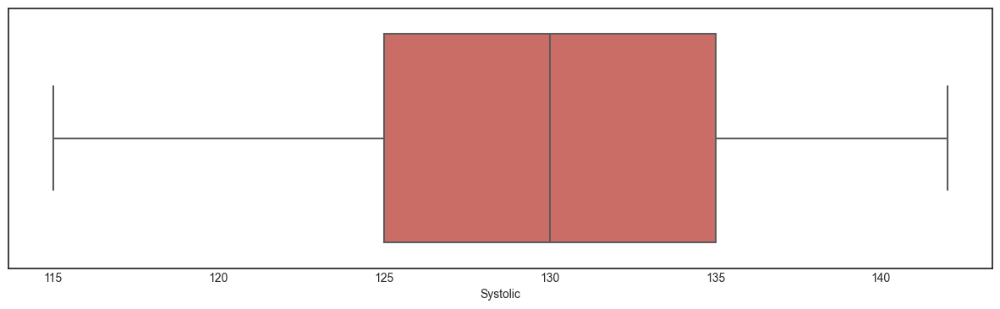

In [37]:
plt.figure(figsize=(15,4))
sns.boxplot(x=df['Systolic'], data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

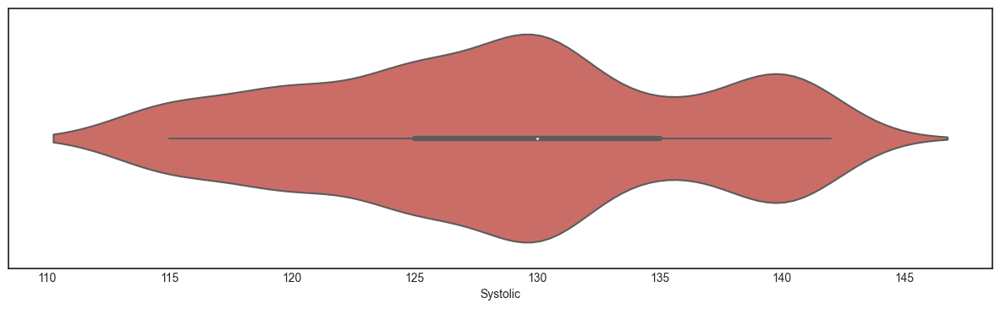

In [38]:
plt.figure(figsize=(15,4))
sns.violinplot(x=df['Systolic'], data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

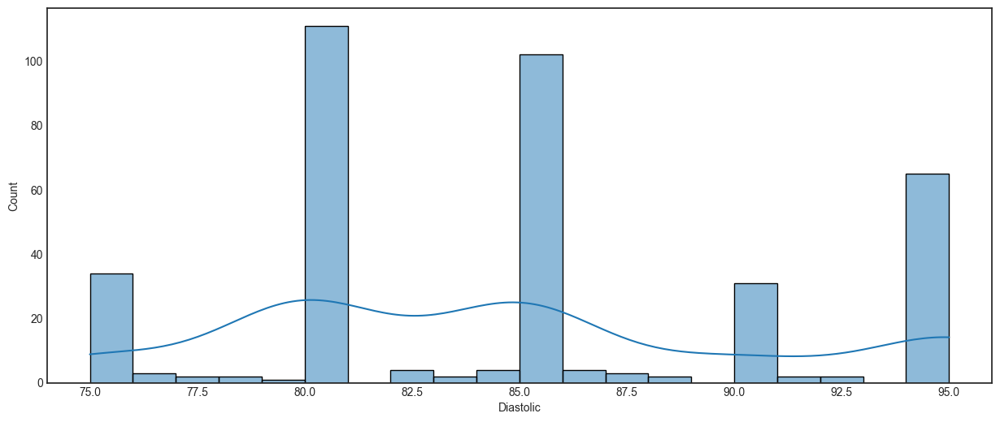

In [39]:
plt.figure(figsize=(15,6))
sns.histplot(x=df['Diastolic'], kde = True, bins = 20, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

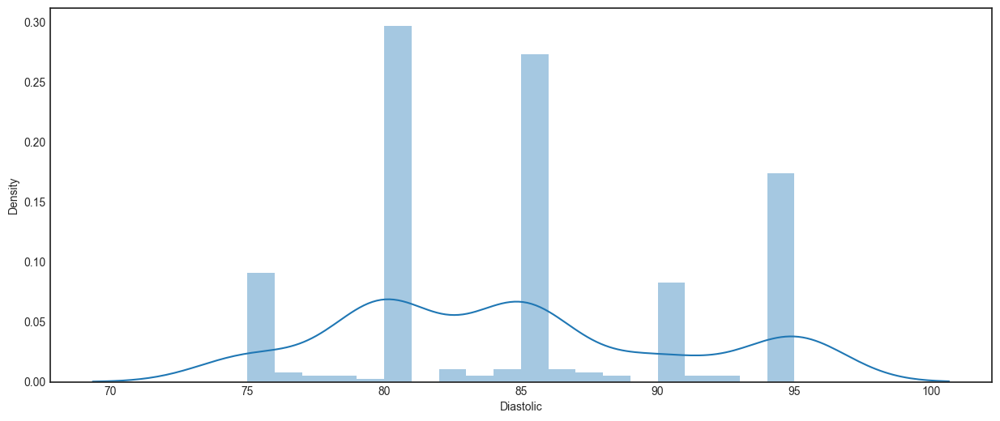

In [40]:
plt.figure(figsize=(15,6))
sns.distplot(df['Diastolic'], kde = True, bins = 20)
plt.xticks(rotation = 0)
plt.show()

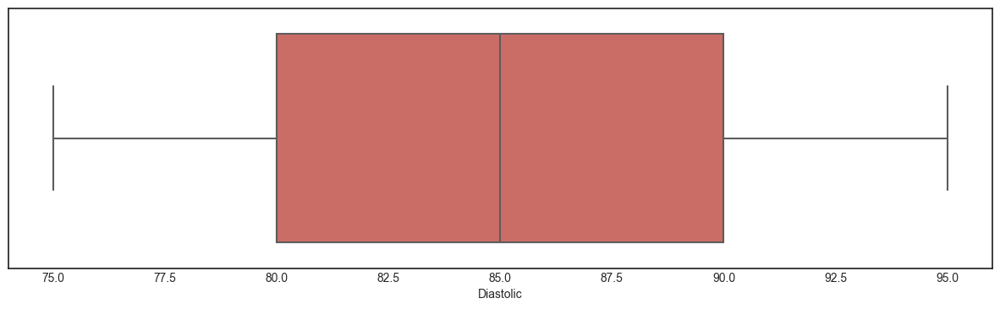

In [41]:
plt.figure(figsize=(15,4))
sns.boxplot(x=df['Diastolic'], data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

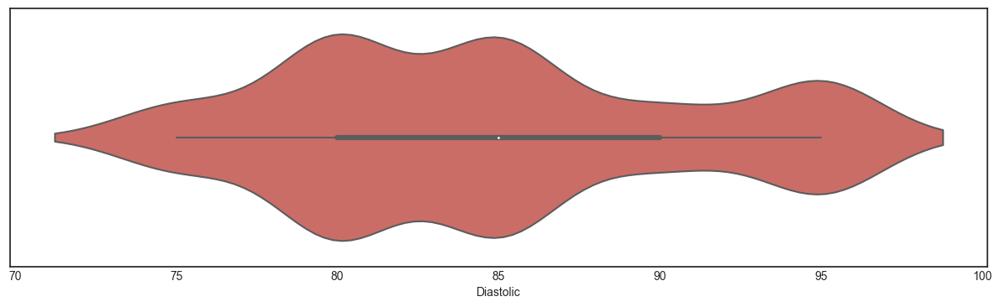

In [42]:
plt.figure(figsize=(15,4))
sns.violinplot(x=df['Diastolic'], data=df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

In [43]:
fig=px.scatter_3d(df,x='BMI Category',y='Blood Pressure',z='Heart Rate',
                  color='Sleep Disorder',width=900,height=800,
                  color_discrete_sequence=['white','#4A235A','#C39BD3'])


fig.update_layout(title='The relationship between (BMI Category, Blood Pressure and Heart Rate) and their effect on Sleep Disorder',
                  titlefont={'size': 20,'family': 'Serif'},
                  showlegend=True)



fig.show()

In [44]:
for column in numerical_columns:
    if column != 'Person ID':
        fig = px.histogram(df, x=column, nbins=20, histnorm='probability density')
        fig.update_layout(title=f"Histogram of {column}", xaxis_title=column, yaxis_title='probability density')
        fig.show()

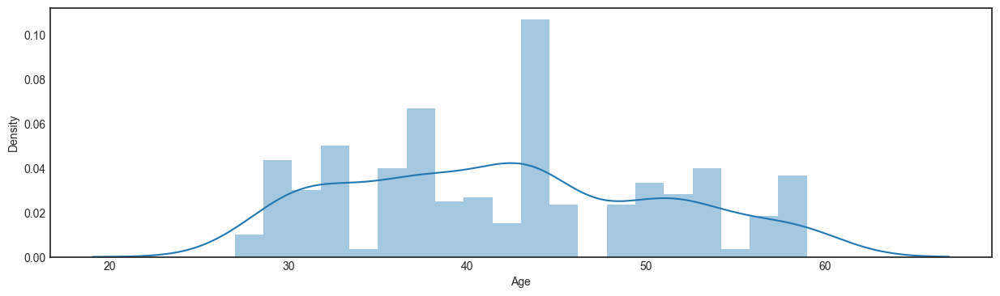

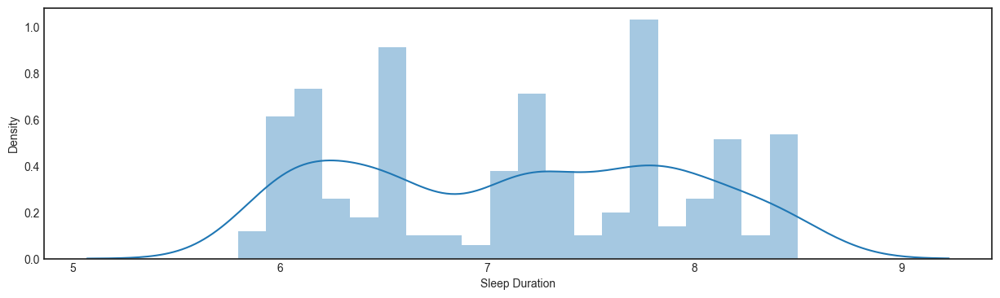

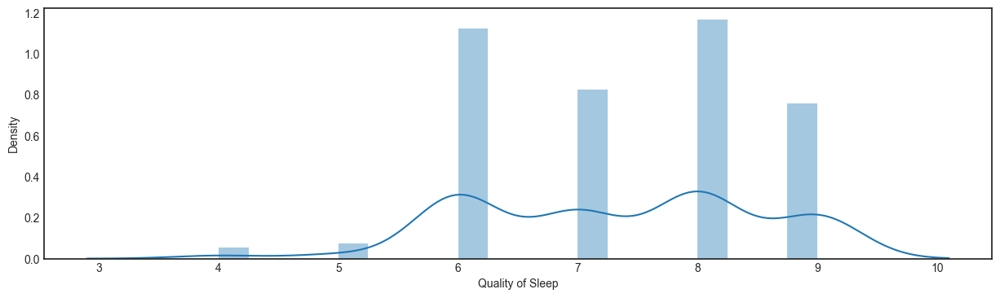

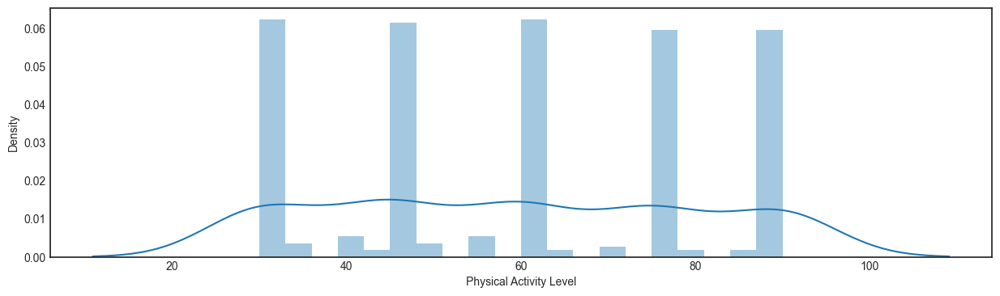

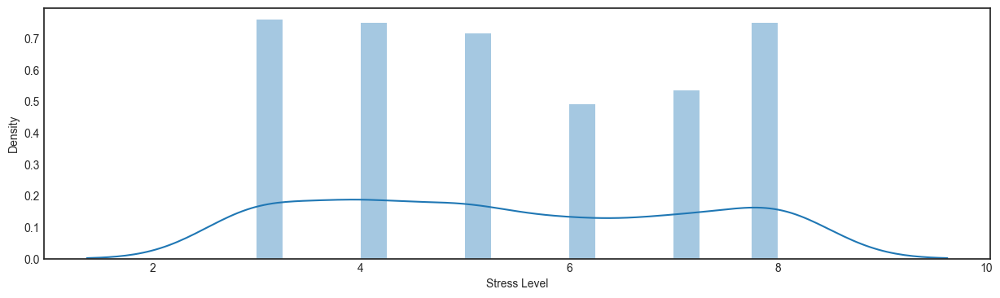

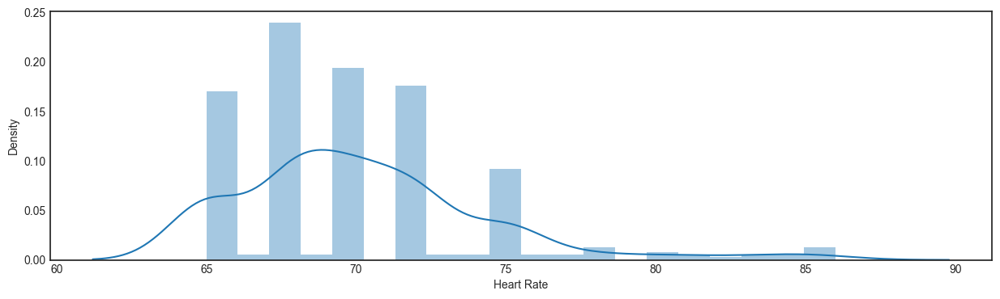

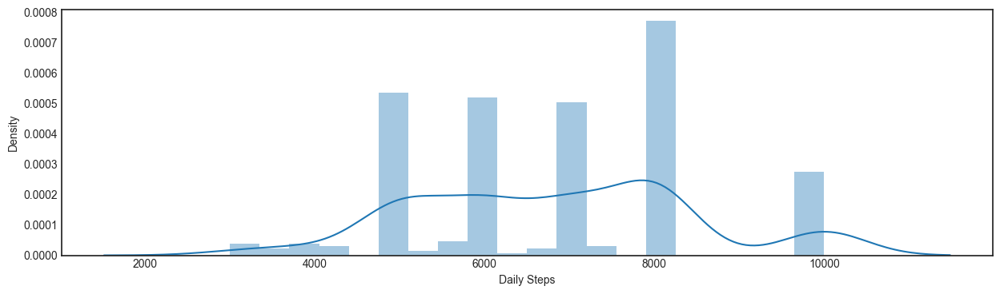

In [45]:
for i in numerical_columns:
    if i != 'Person ID':
        plt.figure(figsize=(15,4))
        sns.distplot(df[i], kde = True, bins = 20)
        plt.xticks(rotation = 0)
        plt.show()

In [46]:
for column in numerical_columns:
    if column != 'Person ID':
        fig = px.box(df, y=column)
        fig.update_layout(title=f"Box Plot of {column}", yaxis_title=column)
        fig.show()

In [47]:
for column in numerical_columns:
    if column != 'Person ID':
        fig = px.violin(df, y=column)
        fig.update_layout(title=f"Box Plot of {column}", yaxis_title=column)
        fig.show()

In [48]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID' and j != 'Blood Pressure':
            fig = px.bar(df, x=j, y=i)
            fig.show()

In [49]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID' and j != 'Blood Pressure':
            fig = px.box(df, x=j, y=i)
            fig.show()


In [50]:
for i in numerical_columns:
    for j in object_columns:
        if i != 'Person ID' and j != 'Blood Pressure':
            fig = px.violin(df, x=j, y=i)
            fig.show()

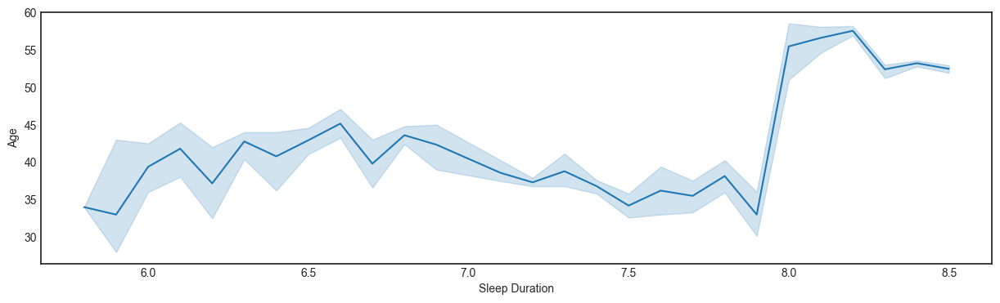

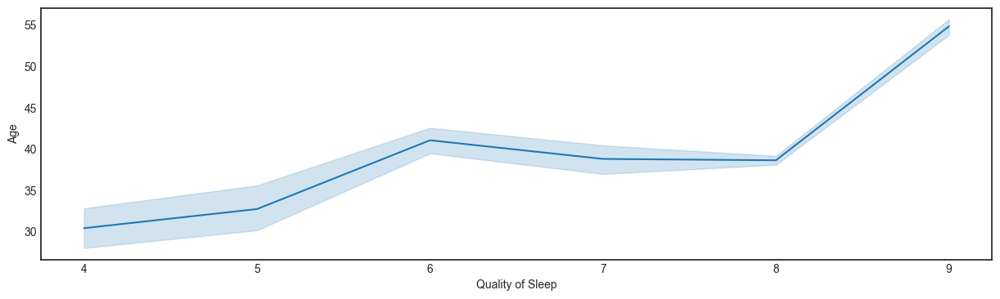

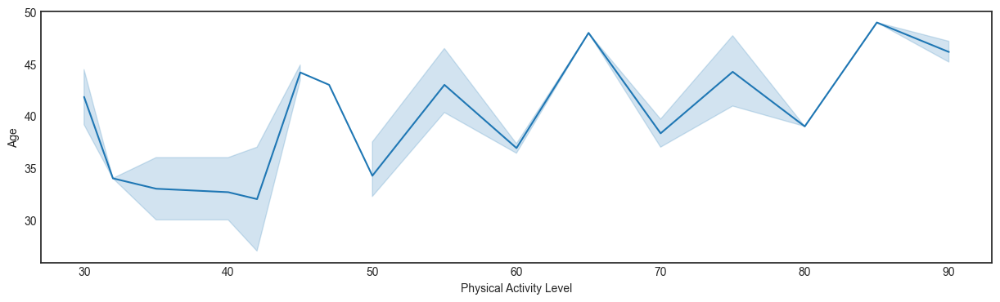

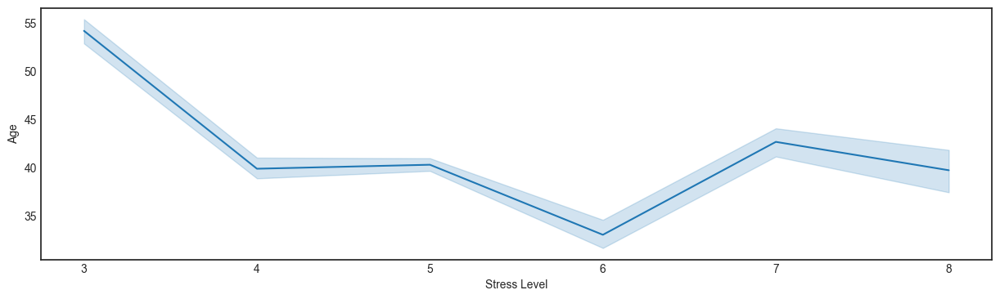

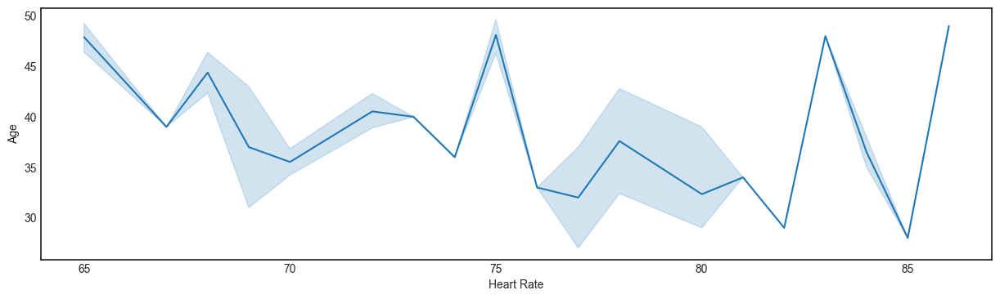

...

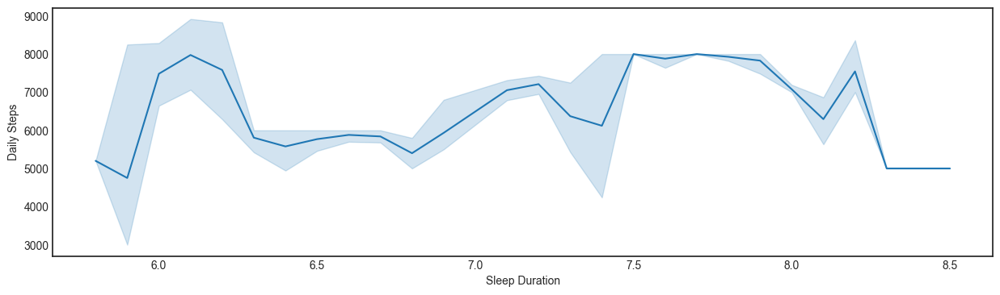

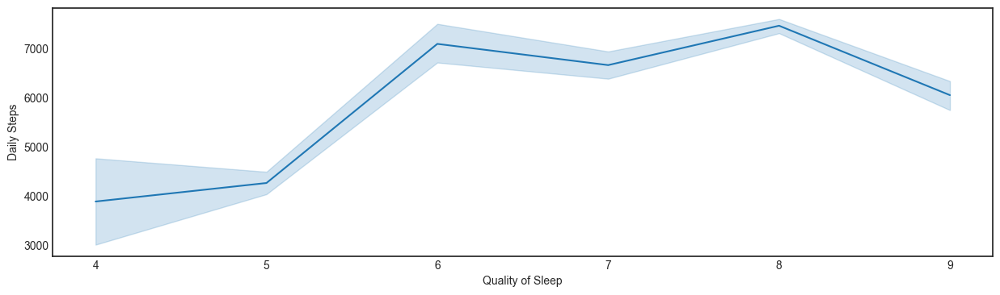

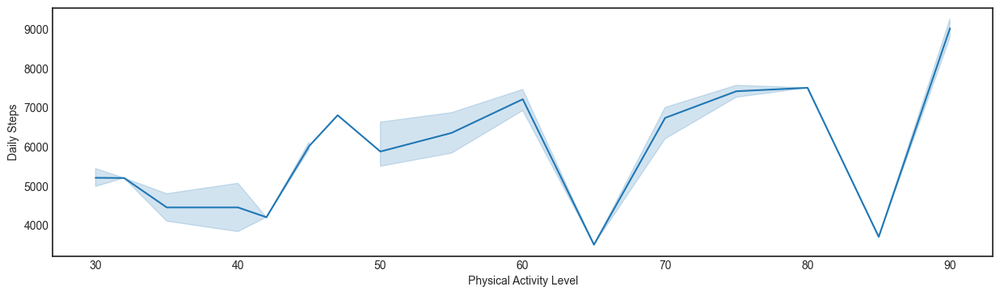

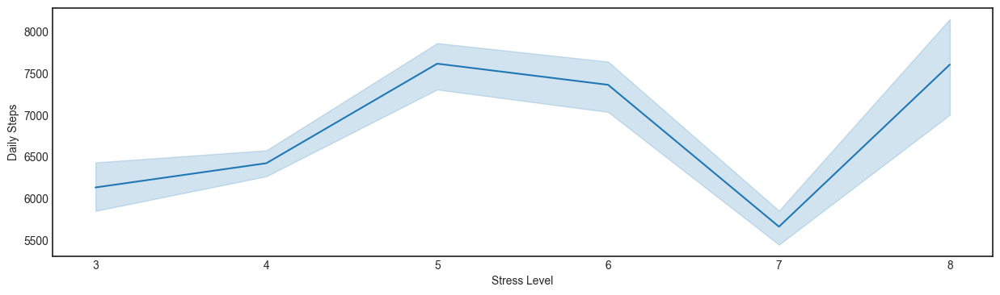

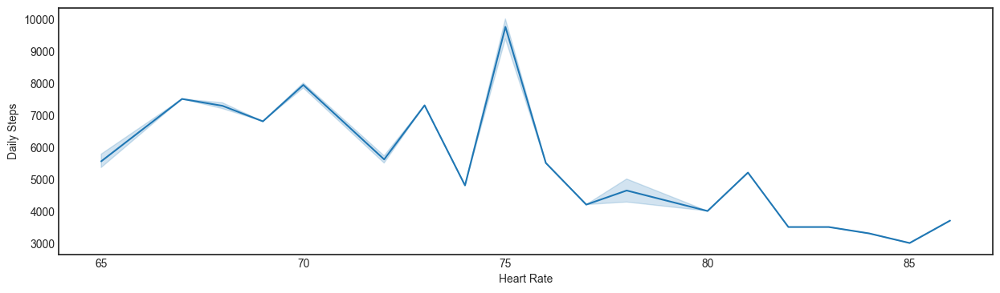

In [51]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != 'Person ID':
            if j != 'Person ID':
                if i != j:
                    plt.figure(figsize=(15,4))
                    sns.lineplot(x = df[j], y = df[i], data = df, palette = 'hls')
                    plt.show()

## Data preprocessing

In [52]:
df.columns

Index(['Person ID', 'Gender', 'Age', 'Occupation', 'Sleep Duration',
       'Quality of Sleep', 'Physical Activity Level', 'Stress Level',
       'BMI Category', 'Blood Pressure', 'Heart Rate', 'Daily Steps',
       'Sleep Disorder', 'Systolic', 'Diastolic'],
      dtype='object')

In [53]:
average_systolic = df['Systolic'].mean()
average_diastolic = df['Diastolic'].mean()

print(f"Average Systolic Pressure: {average_systolic}")
print(f"Average Diastolic Pressure: {average_diastolic}")

Average Systolic Pressure: 128.55347593582889
Average Diastolic Pressure: 84.64973262032086


In [54]:
df_selected = df.copy()

In [55]:
df_selected = df_selected.drop(['Person ID', 'Blood Pressure'], axis = 1)
# df_selected

In [56]:
df_encoded = pd.get_dummies(df_selected, columns=['Gender', 'Occupation', 'BMI Category'])

In [57]:
correlation_matrix = df_encoded.corr()

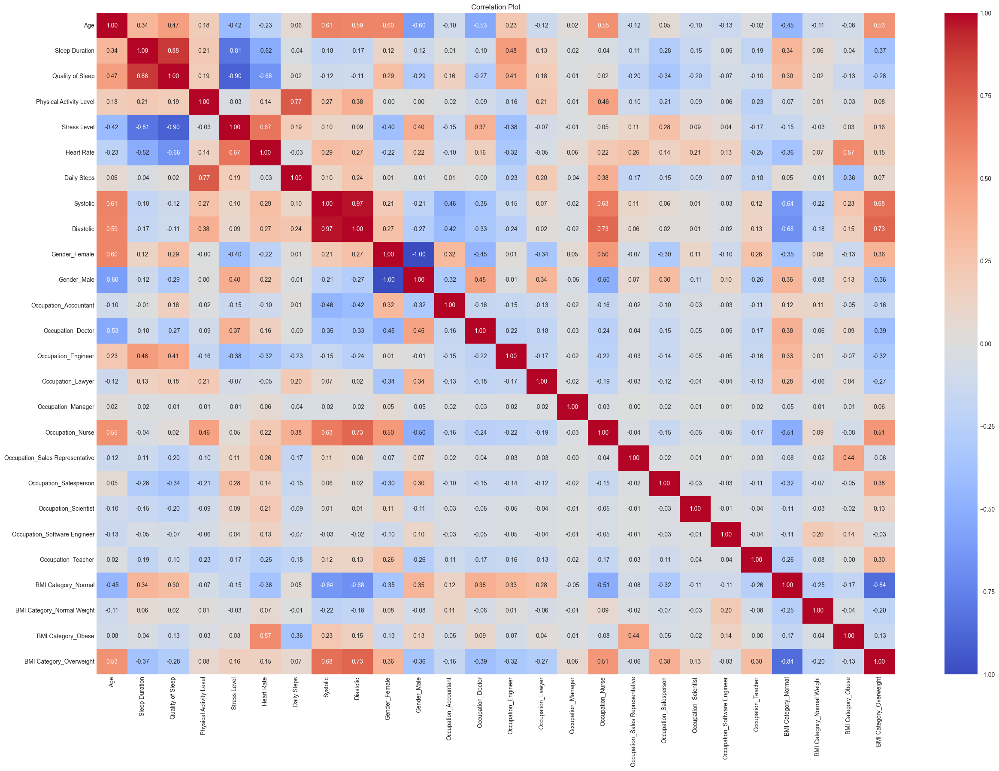

In [58]:
plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Plot')
plt.show()

In [59]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_encoded['Sleep Disorder'] = label_encoder.fit_transform(df_encoded['Sleep Disorder'])
# df_encoded.head(10)

In [60]:
df_encoded.columns

Index(['Age', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level',
       'Stress Level', 'Heart Rate', 'Daily Steps', 'Sleep Disorder',
       'Systolic', 'Diastolic', 'Gender_Female', 'Gender_Male',
       'Occupation_Accountant', 'Occupation_Doctor', 'Occupation_Engineer',
       'Occupation_Lawyer', 'Occupation_Manager', 'Occupation_Nurse',
       'Occupation_Sales Representative', 'Occupation_Salesperson',
       'Occupation_Scientist', 'Occupation_Software Engineer',
       'Occupation_Teacher', 'BMI Category_Normal',
       'BMI Category_Normal Weight', 'BMI Category_Obese',
       'BMI Category_Overweight'],
      dtype='object')

In [61]:
from sklearn.ensemble import RandomForestClassifier
# Assuming X is the feature matrix and y is the target variable
x = df_encoded.drop('Sleep Disorder', axis=1) # Drop the target variable from the feature
y = df_encoded['Sleep Disorder']
# Create a random forest classifier
clf = RandomForestClassifier()
# Fit the classifier to the data
clf.fit(x, y)
# Get feature importance scores
feature_importance = clf.feature_importances_
# Create a DataFrame to display feature importance scores
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
# Print the feature importance scores
print(feature_importance_df)

                            Feature  Importance
7                          Systolic    0.141286
8                         Diastolic    0.137230
22              BMI Category_Normal    0.113766
25          BMI Category_Overweight    0.109626
0                               Age    0.081662
1                    Sleep Duration    0.076983
16                 Occupation_Nurse    0.068840
5                        Heart Rate    0.046618
3           Physical Activity Level    0.046310
6                       Daily Steps    0.044181
4                      Stress Level    0.029043
18           Occupation_Salesperson    0.028033
2                  Quality of Sleep    0.025789
21               Occupation_Teacher    0.016258
9                     Gender_Female    0.004650
10                      Gender_Male    0.004634
13              Occupation_Engineer    0.004068
17  Occupation_Sales Representative    0.003911
23       BMI Category_Normal Weight    0.003733
20     Occupation_Software Engineer    0

## Data Splitting

In [62]:
from sklearn.model_selection import train_test_split

In [63]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


## Logistic Regression

In [64]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

In [65]:
logreg = LogisticRegression()

In [66]:
logreg.fit(x_train,y_train)

LogisticRegression()

In [67]:
lr_y_pred = logreg.predict(x_test)

In [68]:
accuracy = accuracy_score(y_test, lr_y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6933333333333334


In [69]:
report = classification_report(y_test, lr_y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.31      0.36        16
           1       0.71      0.86      0.78        43
           2       0.91      0.62      0.74        16

    accuracy                           0.69        75
   macro avg       0.68      0.60      0.63        75
weighted avg       0.69      0.69      0.68        75



In [86]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
#from sklearn.linear_model import LogisticRegression

# Assuming you have your dataset loaded into a DataFrame called 'data'
# X should contain the predictor variables

# Example: Assuming 'X' contains your features and 'y' contains the target variable
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit a model (e.g., Logistic Regression) to your data
# Here, I'm using Logistic Regression as an example
# You can replace it with the model you have trained (XGBoost, Decision Tree, etc.)
#model = LogisticRegression()
#model.fit(X_train, y_train)

# Calculate VIF for each feature
def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

# Exclude the target variable from VIF calculation
x_vif = x_train.copy()

# Standardize the features (optional but recommended for VIF calculation)
scaler = StandardScaler()
x_vif_scaled = scaler.fit_transform(x_vif)
x_vif_scaled = pd.DataFrame(x_vif_scaled, columns=x_vif.columns)

# Calculate VIF
vif_scores = calculate_vif(x_vif_scaled)

# Display the VIF scores
print(vif_scores)


                           Variable         VIF
0                               Age   19.612240
1                    Sleep Duration   11.243120
2                  Quality of Sleep   26.475860
3           Physical Activity Level    6.792245
4                      Stress Level   22.826836
5                        Heart Rate   10.032028
6                       Daily Steps    7.643729
7                          Systolic  107.298354
8                         Diastolic  115.519693
9                     Gender_Female         inf
10                      Gender_Male         inf
11            Occupation_Accountant         inf
12                Occupation_Doctor         inf
13              Occupation_Engineer         inf
14                Occupation_Lawyer         inf
15               Occupation_Manager         inf
16                 Occupation_Nurse         inf
17  Occupation_Sales Representative         inf
18           Occupation_Salesperson         inf
19             Occupation_Scientist     

## Decision Tree

In [88]:
from sklearn.tree import DecisionTreeClassifier

In [89]:
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)

DecisionTreeClassifier()

In [90]:
dt_y_pred = dt.predict(x_test)

In [91]:
accuracy = accuracy_score(y_test, dt_y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.88


In [92]:
report = classification_report(y_test, dt_y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.81      0.76        16
           1       0.95      0.98      0.97        43
           2       0.85      0.69      0.76        16

    accuracy                           0.88        75
   macro avg       0.84      0.83      0.83        75
weighted avg       0.88      0.88      0.88        75



In [93]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
#from sklearn.linear_model import LogisticRegression

# Assuming you have your dataset loaded into a DataFrame called 'data'
# X should contain the predictor variables

# Example: Assuming 'X' contains your features and 'y' contains the target variable
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit a model (e.g., Logistic Regression) to your data
# Here, I'm using Logistic Regression as an example
# You can replace it with the model you have trained (XGBoost, Decision Tree, etc.)
#model = LogisticRegression()
#model.fit(X_train, y_train)

# Calculate VIF for each feature
def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

# Exclude the target variable from VIF calculation
x_vif = x_train.copy()

# Standardize the features (optional but recommended for VIF calculation)
scaler = StandardScaler()
x_vif_scaled = scaler.fit_transform(x_vif)
x_vif_scaled = pd.DataFrame(x_vif_scaled, columns=x_vif.columns)

# Calculate VIF
vif_scores = calculate_vif(x_vif_scaled)

# Display the VIF scores
print(vif_scores)

                           Variable         VIF
0                               Age   19.612240
1                    Sleep Duration   11.243120
2                  Quality of Sleep   26.475860
3           Physical Activity Level    6.792245
4                      Stress Level   22.826836
5                        Heart Rate   10.032028
6                       Daily Steps    7.643729
7                          Systolic  107.298354
8                         Diastolic  115.519693
9                     Gender_Female         inf
10                      Gender_Male         inf
11            Occupation_Accountant         inf
12                Occupation_Doctor         inf
13              Occupation_Engineer         inf
14                Occupation_Lawyer         inf
15               Occupation_Manager         inf
16                 Occupation_Nurse         inf
17  Occupation_Sales Representative         inf
18           Occupation_Salesperson         inf
19             Occupation_Scientist     

## XGboost

In [75]:
import xgboost as xgb

In [76]:
xgb_model = xgb.XGBClassifier()

In [77]:
xgb_model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [78]:
xgb_y_pred = xgb_model.predict(x_test)

In [79]:
accuracy = accuracy_score(y_test, xgb_y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9066666666666666


In [80]:
report = classification_report(y_test, xgb_y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.81      0.81        16
           1       0.95      0.98      0.97        43
           2       0.87      0.81      0.84        16

    accuracy                           0.91        75
   macro avg       0.88      0.87      0.87        75
weighted avg       0.91      0.91      0.91        75



## Models evaluation

In [81]:
from sklearn.metrics import confusion_matrix

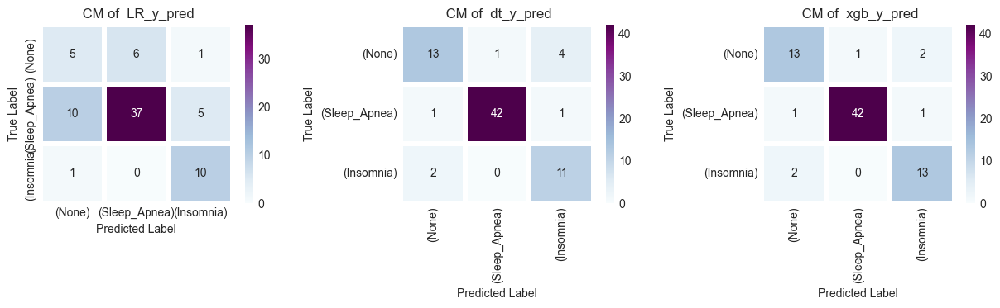

In [82]:
models_predictions=[lr_y_pred,dt_y_pred,xgb_y_pred]
model={1:'LR_y_pred',2:'dt_y_pred',3:'xgb_y_pred'}


plt.figure(figsize=(15,7))
for i,y_pred in enumerate(models_predictions,1) :
    
    cm = confusion_matrix(y_pred,y_test)
    
    plt.subplot(2,3,i)
    sns.heatmap(cm,cmap='BuPu',linewidth=3,fmt='',annot=True,
                xticklabels=['(None)','(Sleep_Apnea)','(Insomnia)'],
                yticklabels=['(None)','(Sleep_Apnea)','(Insomnia)'])
    
    
    plt.title(' CM of  '+ model[i])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.subplots_adjust(hspace=0.5,wspace=0.5)

In [83]:
# import shap

# shap_values = shap.TreeExplainer(xgb).shap_values(x_test)
# shap.summary_plot(shap_values, x_test,class_names=['None','Sleep_Apnea','Insomnia'])
